<a href="https://colab.research.google.com/github/klnreddy14/spoiler_shield/blob/main/Spoiler_Shield_Solution_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### IMDB Spoiler Dataset Overview

The IMDB Spoiler Dataset comprises two primary files, providing a comprehensive collection of user-generated reviews and metadata about movies and TV shows.

#### IMDB_reviews.json:

- **review_date:** Date when the review was written.
- **movie_id:** A unique identifier for the item, linking it to corresponding metadata in the IMDB_movie_details.json file.
- **user_id:** A unique identifier for the author of the review.
- **is_spoiler:** A binary indicator specifying whether the review contains spoilers or not.
- **review_text:** The textual content of the user's review, providing insights into their opinions and thoughts about the item.
- **rating:** The numerical rating assigned by the user to the item.
- **review_summary:** A concise summary accompanying the review, offering a quick overview of the user's sentiments.

#### IMDB_movie_details.json:

- **movie_id:** A unique identifier linking to the corresponding reviews in the IMDB_reviews file.
- **plot_summary:** A non-spoiler plot summary providing a brief overview of the item's storyline.
- **duration:** The runtime duration of the item.
- **genre:** The associated genres of the item.
- **rating:** The overall rating assigned to the item.
- **release_date:** The date when the item was released.
- **plot_synopsis:** A detailed synopsis of the item's plot, potentially containing spoiler content.

This dual-file dataset allows for a holistic understanding of user reviews, incorporating both textual sentiments and metadata associated with the movies and TV shows. The inclusion of spoiler indicators and non-spoiler plot summaries provides a valuable foundation for training and evaluating a deep learning model aimed at predicting and identifying spoilers within user reviews.


The **objective** of the project involves employing Natural Language Processing (NLP) techniques, specifically deep learning models, to address the challenge of identifying spoilers in IMDb reviews.

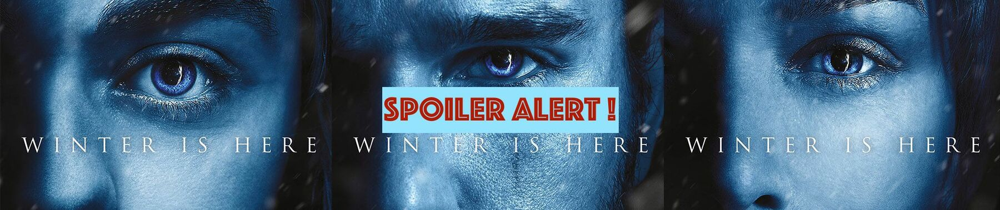

---




***This is where you come in!***  

**Problem Statement ->** Your goal is to develop a system wherein given a review, the model needs to determine whether it contains spoilers or not. This involves understanding the contextual nuances and language intricacies that signify potential plot revelations.


**Steps**
1. Data Collection, Exploration and Preprocessing
2. EDA
3. Pre-Modelling Data Preparation
4. Model Building
5. Model Evaluation
6. Summary



---



## Data Collection, Exploration and Preprocessing

In [ ]:
# ## 1. Data Collection

# Import necessary libraries and modules
import torch  # Import the PyTorch library
from datetime import datetime  # Import the datetime module for time tracking
import gdown
import zipfile
import json
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os
import numpy as np

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# ### Download Dataset
# The dataset can be downloaded using the provided code
zip_url = "https://drive.google.com/uc?export=download&id=16zn74iUWV-Qiv4yYkaMY-spr-LJIys9Z"
#downloaded to /content/dataset/imdb_spoiler/imdb_spoiler_dataset.zip

dataset_path = os.path.join("./dataset", "imdb_spoiler") # the dataset will be downloaded in this folder
zip_file_path = os.path.join(dataset_path, "imdb_spoiler_dataset.zip")

if not os.path.exists(dataset_path):
    os.makedirs(dataset_path)

if not os.path.exists(zip_file_path):
    gdown.download(zip_url, zip_file_path, quiet=False)

with zipfile.ZipFile(zip_file_path ,"r") as zip_ref:
    zip_ref.extractall(dataset_path)

Downloading...
From (original): https://drive.google.com/uc?export=download&id=16zn74iUWV-Qiv4yYkaMY-spr-LJIys9Z
From (redirected): https://drive.google.com/uc?export=download&id=16zn74iUWV-Qiv4yYkaMY-spr-LJIys9Z&confirm=t&uuid=e444686e-e602-453b-b7e6-4add63afbadd
To: /content/dataset/imdb_spoiler/imdb_spoiler_dataset.zip
100%|██████████| 348M/348M [00:08<00:00, 43.3MB/s]


---


### **Load the Reviews Json file & create a pandas dataframe out of it**

Steps-
1. Open JSON file using 'with open .....'
2. Iterate through the file & append to an empty list.
3. Use pd.DataFrame

Note- This is one of the ways to load data, there can be other ways too. Feel free to explore.

In [ ]:
# Your code here
data = []
with open('/content/dataset/imdb_spoiler/IMDB_reviews.json', 'r') as file:
    for line in file:
      try:
        review_data = json.loads(line)
        data.append(review_data)
      except json.JSONDecodeError as e:
        print(f"Error in decoding JSON in line: {line.strip()}")
        print(f"Error decoding JSON: {e}")
movie_reviews_df = pd.DataFrame(data)
movie_reviews_df

,review_date,movie_id,user_id,is_spoiler,review_text,rating,review_summary
0,10 February 2006,tt0111161,ur1898687,True,"In its Oscar year, Shawshank Redemption (writt...",10,A classic piece of unforgettable film-making.
1,6 September 2000,tt0111161,ur0842118,True,The Shawshank Redemption is without a doubt on...,10,Simply amazing. The best film of the 90's.
2,3 August 2001,tt0111161,ur1285640,True,I believe that this film is the best story eve...,8,The best story ever told on film
3,1 September 2002,tt0111161,ur1003471,True,"**Yes, there are SPOILERS here**This film has ...",10,Busy dying or busy living?
4,20 May 2004,tt0111161,ur0226855,True,At the heart of this extraordinary movie is a ...,8,"Great story, wondrously told and acted"
...,...,...,...,...,...,...,...
573908,8 August 1999,tt0139239,ur0100166,False,"Go is wise, fast and pure entertainment. Assem...",10,The best teen movie of the nineties
573909,31 July 1999,tt0139239,ur0021767,False,"Well, what shall I say. this one´s fun at any ...",9,Go - see the movie
573910,20 July 1999,tt0139239,ur0392750,False,"Go is the best movie I have ever seen, and I'v...",10,It's the best movie I've ever seen
573911,11 June 1999,tt0139239,ur0349105,False,Call this 1999 teenage version of Pulp Fiction...,3,Haven't we seen this before?


In [ ]:
## check df shape, info, top 5 rows
movie_reviews_df.shape

(573913, 7)

In [ ]:
movie_reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 573913 entries, 0 to 573912
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   review_date     573913 non-null  object
 1   movie_id        573913 non-null  object
 2   user_id         573913 non-null  object
 3   is_spoiler      573913 non-null  bool  
 4   review_text     573913 non-null  object
 5   rating          573913 non-null  object
 6   review_summary  573913 non-null  object
dtypes: bool(1), object(6)
memory usage: 26.8+ MB


In [ ]:
movie_reviews_df.head()

,review_date,movie_id,user_id,is_spoiler,review_text,rating,review_summary
0,10 February 2006,tt0111161,ur1898687,True,"In its Oscar year, Shawshank Redemption (writt...",10,A classic piece of unforgettable film-making.
1,6 September 2000,tt0111161,ur0842118,True,The Shawshank Redemption is without a doubt on...,10,Simply amazing. The best film of the 90's.
2,3 August 2001,tt0111161,ur1285640,True,I believe that this film is the best story eve...,8,The best story ever told on film
3,1 September 2002,tt0111161,ur1003471,True,"**Yes, there are SPOILERS here**This film has ...",10,Busy dying or busy living?
4,20 May 2004,tt0111161,ur0226855,True,At the heart of this extraordinary movie is a ...,8,"Great story, wondrously told and acted"


### **Similarly, Load the Movie Details Json file & create a pandas dataframe out of it**

In [ ]:
# Your code here
data = []
with open('/content/dataset/imdb_spoiler/IMDB_movie_details.json', 'r') as file:
    for line in file:
      try:
        review_data = json.loads(line)
        data.append(review_data)
      except json.JSONDecodeError as e:
        print(f"Error in decoding JSON in line: {line.strip()}")
        print(f"Error decoding JSON: {e}")
movie_details_df = pd.DataFrame(data)
movie_details_df

,movie_id,plot_summary,duration,genre,rating,release_date,plot_synopsis
0,tt0105112,"Former CIA analyst, Jack Ryan is in England wi...",1h 57min,"[Action, Thriller]",6.9,1992-06-05,"Jack Ryan (Ford) is on a ""working vacation"" in..."
1,tt1204975,"Billy (Michael Douglas), Paddy (Robert De Niro...",1h 45min,[Comedy],6.6,2013-11-01,Four boys around the age of 10 are friends in ...
2,tt0243655,"The setting is Camp Firewood, the year 1981. I...",1h 37min,"[Comedy, Romance]",6.7,2002-04-11,
3,tt0040897,"Fred C. Dobbs and Bob Curtin, both down on the...",2h 6min,"[Adventure, Drama, Western]",8.3,1948-01-24,Fred Dobbs (Humphrey Bogart) and Bob Curtin (T...
4,tt0126886,Tracy Flick is running unopposed for this year...,1h 43min,"[Comedy, Drama, Romance]",7.3,1999-05-07,Jim McAllister (Matthew Broderick) is a much-a...
...,...,...,...,...,...,...,...
1567,tt0289879,Evan Treborn grows up in a small town with his...,1h 53min,"[Sci-Fi, Thriller]",7.7,2004-01-23,"In the year 1998, Evan Treborn (Ashton Kutcher..."
1568,tt1723811,Brandon is a 30-something man living in New Yo...,1h 41min,[Drama],7.2,2012-01-13,"Brandon (Michael Fassbender) is a successful, ..."
1569,tt5013056,Evacuation of Allied soldiers from the British...,1h 46min,"[Action, Drama, History]",8.1,2017-07-21,The film alternates between three different pe...
1570,tt0104014/,"For a while now, beautiful 24-year-old Diana B...",1h 33min,"[Comedy, Drama]",5.3,1992-02-21,


In [ ]:
## check df shape, info, top 5 rows
movie_details_df.shape

(1572, 7)

In [ ]:
movie_details_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1572 entries, 0 to 1571
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   movie_id       1572 non-null   object
 1   plot_summary   1572 non-null   object
 2   duration       1572 non-null   object
 3   genre          1572 non-null   object
 4   rating         1572 non-null   object
 5   release_date   1572 non-null   object
 6   plot_synopsis  1572 non-null   object
dtypes: object(7)
memory usage: 86.1+ KB


### **Combine the 2 datasets**

In [ ]:
# Your code here
combined_df = pd.merge(movie_reviews_df, movie_details_df, on='movie_id')
combined_df

,review_date,movie_id,user_id,is_spoiler,review_text,rating_x,review_summary,plot_summary,duration,genre,rating_y,release_date,plot_synopsis
0,10 February 2006,tt0111161,ur1898687,True,"In its Oscar year, Shawshank Redemption (writt...",10,A classic piece of unforgettable film-making.,Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker..."
1,6 September 2000,tt0111161,ur0842118,True,The Shawshank Redemption is without a doubt on...,10,Simply amazing. The best film of the 90's.,Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker..."
2,3 August 2001,tt0111161,ur1285640,True,I believe that this film is the best story eve...,8,The best story ever told on film,Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker..."
3,1 September 2002,tt0111161,ur1003471,True,"**Yes, there are SPOILERS here**This film has ...",10,Busy dying or busy living?,Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker..."
4,20 May 2004,tt0111161,ur0226855,True,At the heart of this extraordinary movie is a ...,8,"Great story, wondrously told and acted",Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
573901,8 August 1999,tt0139239,ur0100166,False,"Go is wise, fast and pure entertainment. Assem...",10,The best teen movie of the nineties,"Told from three perspectives, a story of a bun...",1h 42min,"[Comedy, Crime]",7.3,1999-04-09,"The film is told out of chronological format, ..."
573902,31 July 1999,tt0139239,ur0021767,False,"Well, what shall I say. this one´s fun at any ...",9,Go - see the movie,"Told from three perspectives, a story of a bun...",1h 42min,"[Comedy, Crime]",7.3,1999-04-09,"The film is told out of chronological format, ..."
573903,20 July 1999,tt0139239,ur0392750,False,"Go is the best movie I have ever seen, and I'v...",10,It's the best movie I've ever seen,"Told from three perspectives, a story of a bun...",1h 42min,"[Comedy, Crime]",7.3,1999-04-09,"The film is told out of chronological format, ..."
573904,11 June 1999,tt0139239,ur0349105,False,Call this 1999 teenage version of Pulp Fiction...,3,Haven't we seen this before?,"Told from three perspectives, a story of a bun...",1h 42min,"[Comedy, Crime]",7.3,1999-04-09,"The film is told out of chronological format, ..."


In [ ]:
combined_df = combined_df.iloc[:5000]  #TBD

In [ ]:
combined_df.head()

,review_date,movie_id,user_id,is_spoiler,review_text,rating_x,review_summary,plot_summary,duration,genre,rating_y,release_date,plot_synopsis
0,10 February 2006,tt0111161,ur1898687,True,"In its Oscar year, Shawshank Redemption (writt...",10,A classic piece of unforgettable film-making.,Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker..."
1,6 September 2000,tt0111161,ur0842118,True,The Shawshank Redemption is without a doubt on...,10,Simply amazing. The best film of the 90's.,Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker..."
2,3 August 2001,tt0111161,ur1285640,True,I believe that this film is the best story eve...,8,The best story ever told on film,Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker..."
3,1 September 2002,tt0111161,ur1003471,True,"**Yes, there are SPOILERS here**This film has ...",10,Busy dying or busy living?,Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker..."
4,20 May 2004,tt0111161,ur0226855,True,At the heart of this extraordinary movie is a ...,8,"Great story, wondrously told and acted",Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker..."


### **Explore the combined dataset**
Some of the EDA steps can be-
(Note- There can be more, what we have listed down is just a subset, feel free to explore the dataset more, get insights, find more relationships b/w features...)

### 1. Analyze Class Distribution

In [ ]:
## Calculate Spoiler vs Non Spoiler % distribution
## Plot bar chart/pie chart anything would work in case of a % distribution. Any other plot in mind???

In [ ]:
# Your code here
combined_df.shape

(5000, 13)

In [ ]:
combined_df.size

65000

In [ ]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   review_date     5000 non-null   object
 1   movie_id        5000 non-null   object
 2   user_id         5000 non-null   object
 3   is_spoiler      5000 non-null   bool  
 4   review_text     5000 non-null   object
 5   rating_x        5000 non-null   object
 6   review_summary  5000 non-null   object
 7   plot_summary    5000 non-null   object
 8   duration        5000 non-null   object
 9   genre           5000 non-null   object
 10  rating_y        5000 non-null   object
 11  release_date    5000 non-null   object
 12  plot_synopsis   5000 non-null   object
dtypes: bool(1), object(12)
memory usage: 473.8+ KB


In [ ]:
combined_df[combined_df['is_spoiler']!=True].shape

(3624, 13)

In [ ]:
combined_df[combined_df['is_spoiler']==True].shape

(1376, 13)

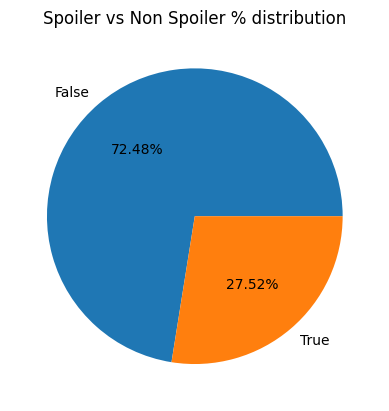

In [ ]:
plt.pie(combined_df['is_spoiler'].value_counts(), labels=combined_df['is_spoiler'].value_counts().index, autopct='%.2f%%')
plt.title('Spoiler vs Non Spoiler % distribution')
plt.show()

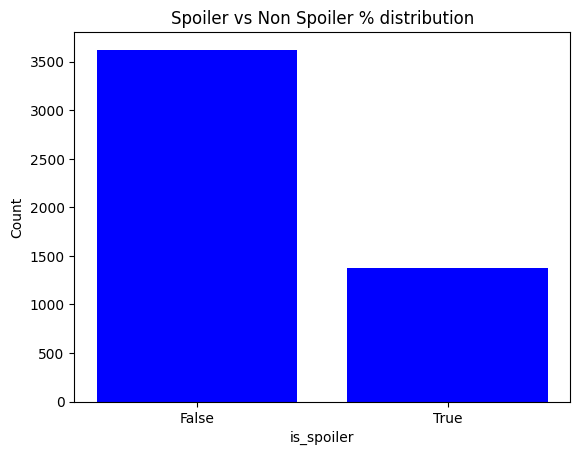

In [ ]:
plt.bar(combined_df['is_spoiler'].value_counts().index,combined_df['is_spoiler'].value_counts(),color='blue')
X_axis = np.arange(2)
plt.xticks(np.arange(len(combined_df['is_spoiler'].value_counts().index.values)),combined_df['is_spoiler'].value_counts().index.values)
plt.xlabel('is_spoiler')
plt.ylabel('Count')
plt.title('Spoiler vs Non Spoiler % distribution')
plt.show()

### 2. Analyze Word Count Distribution

In [ ]:
## Plot appropriate chart for the frequency distribution of no. of words in every review


In [ ]:
# Your code here
combined_df['word_count'] = combined_df['review_text'].apply(lambda x:len(x.split()))
combined_df

<ipython-input-23-488e667082de>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  combined_df['word_count'] = combined_df['review_text'].apply(lambda x:len(x.split()))


,review_date,movie_id,user_id,is_spoiler,review_text,rating_x,review_summary,plot_summary,duration,genre,rating_y,release_date,plot_synopsis,word_count
0,10 February 2006,tt0111161,ur1898687,True,"In its Oscar year, Shawshank Redemption (writt...",10,A classic piece of unforgettable film-making.,Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker...",843
1,6 September 2000,tt0111161,ur0842118,True,The Shawshank Redemption is without a doubt on...,10,Simply amazing. The best film of the 90's.,Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker...",223
2,3 August 2001,tt0111161,ur1285640,True,I believe that this film is the best story eve...,8,The best story ever told on film,Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker...",250
3,1 September 2002,tt0111161,ur1003471,True,"**Yes, there are SPOILERS here**This film has ...",10,Busy dying or busy living?,Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker...",741
4,20 May 2004,tt0111161,ur0226855,True,At the heart of this extraordinary movie is a ...,8,"Great story, wondrously told and acted",Chronicles the experiences of a formerly succe...,2h 22min,"[Crime, Drama]",9.3,1994-10-14,"In 1947, Andy Dufresne (Tim Robbins), a banker...",829
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,29 September 2013,tt0068646,ur46964720,False,Popularly viewed as one of the best American f...,10,My Favourite Film Of All Time 10/10,When the aging head of a famous crime family d...,2h 55min,"[Crime, Drama]",9.2,1972-03-24,"In late summer 1945, guests are gathered for t...",140
4996,15 June 2013,tt0068646,ur41593566,False,It's a great film in the history of film. Such...,9,Simply a Masterpiece.,When the aging head of a famous crime family d...,2h 55min,"[Crime, Drama]",9.2,1972-03-24,"In late summer 1945, guests are gathered for t...",116
4997,14 June 2013,tt0068646,ur19853473,False,I just want to say that is the fantastic movie...,10,Excellent Movie,When the aging head of a famous crime family d...,2h 55min,"[Crime, Drama]",9.2,1972-03-24,"In late summer 1945, guests are gathered for t...",247
4998,16 March 2013,tt0068646,ur37341191,False,The year was 1972. Francis Ford Coppola was in...,10,A masterpiece! A cinematic achievement not mat...,When the aging head of a famous crime family d...,2h 55min,"[Crime, Drama]",9.2,1972-03-24,"In late summer 1945, guests are gathered for t...",618


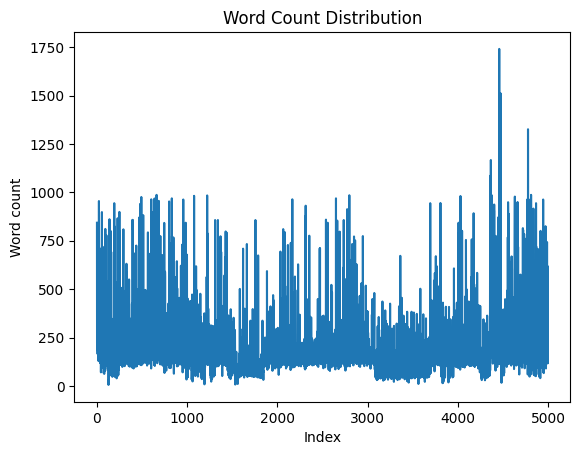

In [ ]:
plt.plot(combined_df.index,combined_df['word_count'],ls='solid')
plt.xlabel('Index')
plt.ylabel('Word count')
plt.title('Word Count Distribution')
plt.show()

### Additional note- You can also plot the above frequency distribution for each class, i.e. Spoiler & Non Spoiler

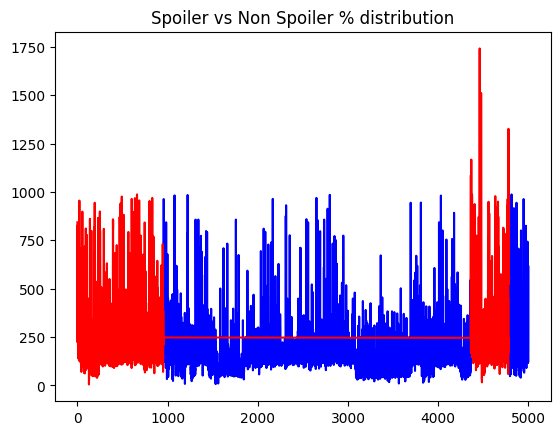

In [ ]:
# Your code here
fig,ax = plt.subplots()
ax.plot(combined_df[combined_df['is_spoiler']==False].index,combined_df[combined_df['is_spoiler']==False]['word_count'],ls='solid',color='blue',label='is_spoiler=False')
ax.plot(combined_df[combined_df['is_spoiler']==True].index,combined_df[combined_df['is_spoiler']==True]['word_count'],ls='solid',color='red',label='is_spoiler=True')
plt.title('Spoiler vs Non Spoiler % distribution')
plt.show()

**Observations**

*Document your observations for the analysis done till now, any findings, insights etc.*

-
-
-

### 3. Create a word cloud
This helps in visualizing important words in the dataset, the words that are being mostly used.

**Hint**- You would want to ideally remove the stopwords before creating a word cloud since the stopwords generally would be the most frequent words but those don't give any insights, right? Also, you can create word clouds for both the classes!

In [ ]:
## remove stopwords- use nltk or spacy for that

In [ ]:
# Your code here
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

nltk.download('punkt_tab')
nltk.download('stopwords')

stop_words = set(stopwords.words('english'))

combined_df['review_text_after_stop_words'] = combined_df['review_text'].apply(lambda review_text:' '.join([word.lower() for word in word_tokenize(review_text) if word.lower() not in stop_words]))#lambda x:len(x.split()))
combined_df['review_text_after_stop_words']

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
<ipython-input-27-838fade701e9>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  combined_df['review_text_after_stop_words'] = combined_df['review_text'].apply(lambda review_text:' '.join([word.lower() for word in word_tokenize(review_text) if word.lower() not in stop_words]))#lambda x:len(x.split()))


,review_text_after_stop_words
0,"oscar year , shawshank redemption ( written di..."
1,shawshank redemption without doubt one brillia...
2,"believe film best story ever told film , 'm te..."
3,"* * yes , spoilers * * film emotional impact ,..."
4,heart extraordinary movie brilliant indelible ...
...,...
4995,popularly viewed one best american films ever ...
4996,'s great film history film . well sculpted fil...
4997,want say fantastic movie . wonder old new york...
4998,year 1972 . francis ford coppola beginning car...


In [ ]:
## create wordcloud for both the classes & visualize

In [ ]:
!pip install wordcloud

Text(0.5, 1.0, 'Spoiler=True')

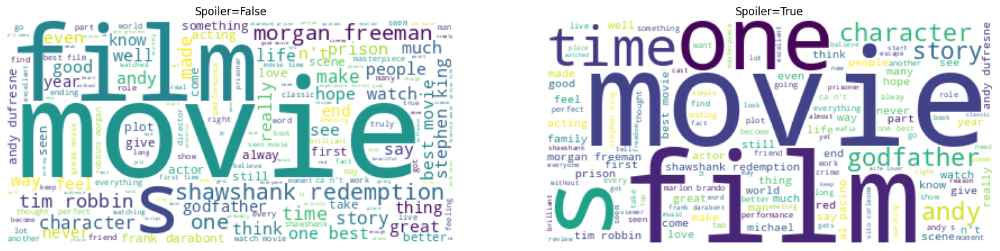

In [ ]:
# Your code here
from wordcloud import WordCloud, STOPWORDS

combined_review_text_spoiler_False = " ".join(review_text_after_stop_words for review_text_after_stop_words in combined_df[combined_df['is_spoiler']==False]['review_text_after_stop_words'])

combined_review_text_spoiler_True = " ".join(review_text_after_stop_words for review_text_after_stop_words in combined_df[combined_df['is_spoiler']==True]['review_text_after_stop_words'])

wordcloud_spoiler_False = WordCloud(background_color="white").generate(combined_review_text_spoiler_False)

wordcloud_spoiler_True = WordCloud(background_color="white").generate(combined_review_text_spoiler_True)

fig,ax = plt.subplots(1,2,figsize=(20,15))

ax[0].imshow(wordcloud_spoiler_False)
ax[0].axis("off")
ax[0].set_title("Spoiler=False")

ax[1].imshow(wordcloud_spoiler_True)
ax[1].axis("off")
ax[1].set_title("Spoiler=True")



In [ ]:
# Repeating same for plot summary
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

nltk.download('punkt')
nltk.download('stopwords')

stop_words = set(stopwords.words('english'))
special_chars = [',', '.', '!', '?', ';', ':', '(', ')', '[', ']', '{', '}', '"', "'", '-', '_',',','\'']
stop_words.update(special_chars)

combined_df['plot_summary_after_stop_words'] = combined_df['plot_summary'].apply(lambda plot_summary:' '.join([word for word in word_tokenize(plot_summary) if word.lower() not in stop_words]))#lambda x:len(x.split()))
combined_df['plot_summary_after_stop_words']

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
<ipython-input-31-ff6e01e85cb0>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  combined_df['plot_summary_after_stop_words'] = combined_df['plot_summary'].apply(lambda plot_summary:' '.join([word for word in word_tokenize(plot_summary) if word.lower() not in stop_words]))#lambda x:len(x.split()))


,plot_summary_after_stop_words
0,Chronicles experiences formerly successful ban...
1,Chronicles experiences formerly successful ban...
2,Chronicles experiences formerly successful ban...
3,Chronicles experiences formerly successful ban...
4,Chronicles experiences formerly successful ban...
...,...
4995,aging head famous crime family decides transfe...
4996,aging head famous crime family decides transfe...
4997,aging head famous crime family decides transfe...
4998,aging head famous crime family decides transfe...


Text(0.5, 1.0, 'Spoiler=True')

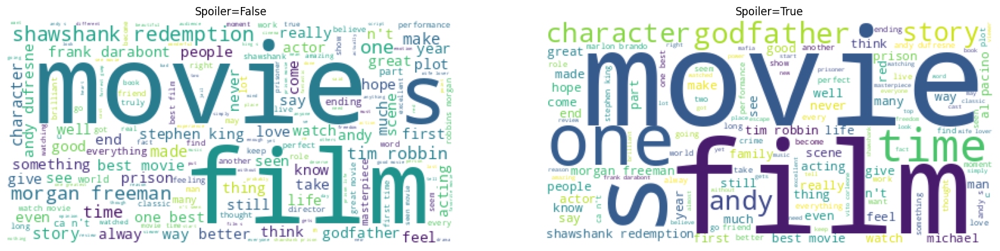

In [ ]:
from wordcloud import WordCloud, STOPWORDS

combined_plot_summary_spoiler_False = " ".join(review_text_after_stop_words for review_text_after_stop_words in combined_df[combined_df['is_spoiler']==False]['plot_summary_after_stop_words'])

combined_plot_summary_spoiler_True = " ".join(review_text_after_stop_words for review_text_after_stop_words in combined_df[combined_df['is_spoiler']==True]['plot_summary_after_stop_words'])

wordcloud_spoiler_False = WordCloud(background_color="white").generate(combined_review_text_spoiler_False)

wordcloud_spoiler_True = WordCloud(background_color="white").generate(combined_review_text_spoiler_True)

fig,ax = plt.subplots(1,2,figsize=(20,15))

ax[0].imshow(wordcloud_spoiler_False)
ax[0].axis("off")
ax[0].set_title("Spoiler=False")

ax[1].imshow(wordcloud_spoiler_True)
ax[1].axis("off")
ax[1].set_title("Spoiler=True")

### 4. Calculate similarity b/w reviews & plot summary
The hypothesis we're trying to test here- is there a similarity b/w the reviews with spoilers & movie plot summary? Intuitively we would expect that if a user has given a spoiler in a movie review, it should have a high similarity with the movie plot, isn't it? That's exactly what you would test here!

There are multiple ways of calculating similarity b/w 2 sets of text-

1. Using TFIDF vectorization
2. Using Pretrained-embeddings
.
.

We are sharing the imports necessary for using TFIDF vectorization for converting text to vectors.

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from tqdm.notebook import tqdm

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
## TFIDF vectorization for review text after stop words
# Your code here
tfidf = TfidfVectorizer()
tfidf_matrix_review_text = tfidf.fit_transform(combined_df['review_text_after_stop_words'])
tfidf_matrix_review_text_df=pd.DataFrame(tfidf_matrix_review_text.toarray(),columns=tfidf.get_feature_names_out())
tfidf_matrix_review_text_df

,00,000,0000000,0001,0006,01,02,03,04,040,...,zootrope,ándale,ángel,été,être,ëfail,ëvideomalaiseí,ıs,шit,血性
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
## TFIDF vectorization for plot summary
# Your code here
#tfidf = TfidfVectorizer()
tfidf_matrix_plot_summary = tfidf.fit_transform(combined_df['plot_summary_after_stop_words'])
tfidf_matrix_plot_summary_df=pd.DataFrame(tfidf_matrix_plot_summary.toarray(),columns=tfidf.get_feature_names_out())
tfidf_matrix_plot_summary_df

,aging,along,banker,befriends,begins,chosen,chronicles,commit,crime,dealing,...,term,torturous,transfer,unfortunate,unique,war,way,well,wise,written
0,0.000000,0.161539,0.161539,0.161539,0.000000,0.000000,0.161539,0.161539,0.142111,0.161539,...,0.161539,0.161539,0.000000,0.000000,0.161539,0.000000,0.323078,0.000000,0.161539,0.142111
1,0.000000,0.161539,0.161539,0.161539,0.000000,0.000000,0.161539,0.161539,0.142111,0.161539,...,0.161539,0.161539,0.000000,0.000000,0.161539,0.000000,0.323078,0.000000,0.161539,0.142111
2,0.000000,0.161539,0.161539,0.161539,0.000000,0.000000,0.161539,0.161539,0.142111,0.161539,...,0.161539,0.161539,0.000000,0.000000,0.161539,0.000000,0.323078,0.000000,0.161539,0.142111
3,0.000000,0.161539,0.161539,0.161539,0.000000,0.000000,0.161539,0.161539,0.142111,0.161539,...,0.161539,0.161539,0.000000,0.000000,0.161539,0.000000,0.323078,0.000000,0.161539,0.142111
4,0.000000,0.161539,0.161539,0.161539,0.000000,0.000000,0.161539,0.161539,0.142111,0.161539,...,0.161539,0.161539,0.000000,0.000000,0.161539,0.000000,0.323078,0.000000,0.161539,0.142111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.175896,0.000000,0.000000,0.000000,0.175896,0.175896,0.000000,0.000000,0.057559,0.000000,...,0.000000,0.000000,0.175896,0.175896,0.000000,0.175896,0.000000,0.175896,0.000000,0.057559
4996,0.175896,0.000000,0.000000,0.000000,0.175896,0.175896,0.000000,0.000000,0.057559,0.000000,...,0.000000,0.000000,0.175896,0.175896,0.000000,0.175896,0.000000,0.175896,0.000000,0.057559
4997,0.175896,0.000000,0.000000,0.000000,0.175896,0.175896,0.000000,0.000000,0.057559,0.000000,...,0.000000,0.000000,0.175896,0.175896,0.000000,0.175896,0.000000,0.175896,0.000000,0.057559
4998,0.175896,0.000000,0.000000,0.000000,0.175896,0.175896,0.000000,0.000000,0.057559,0.000000,...,0.000000,0.000000,0.175896,0.175896,0.000000,0.175896,0.000000,0.175896,0.000000,0.057559


What next after converting text to vectors? How do we measure the similarity? Again we have different types of similarity measures. One of them is cosine similarity & is probably the most frequent method used for similarity. Reference- https://medium.com/@ahmetmnirkocaman/how-to-measure-text-similarity-a-comprehensive-guide-6c6f24fc01fe

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import TfidfVectorizer

# Create a single TfidfVectorizer instance
tfidf_vectorizer = TfidfVectorizer()

# Fit and transform on the combined data
# (or fit on one and transform on both)
tfidf_matrix_review_text = tfidf_vectorizer.fit_transform(combined_df['review_text_after_stop_words'])
tfidf_matrix_plot_summary = tfidf_vectorizer.transform(combined_df['plot_summary_after_stop_words'])


# Convert to DataFrames (optional, but might be useful for inspection)
tfidf_matrix_review_text_df = pd.DataFrame(tfidf_matrix_review_text.toarray(), columns=tfidf_vectorizer.get_feature_names_out())
tfidf_matrix_plot_summary_df = pd.DataFrame(tfidf_matrix_plot_summary.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Calculate cosine similarities
cosine_similarities = cosine_similarity(tfidf_matrix_review_text, tfidf_matrix_plot_summary)
# Note: I'm using the sparse matrices directly here,
# which is more efficient than converting to dense arrays
cosine_similarities

array([[0.0478129 , 0.0478129 , 0.0478129 , ..., 0.01535103, 0.01535103,
        0.01535103],
       [0.03323804, 0.03323804, 0.03323804, ..., 0.01252202, 0.01252202,
        0.01252202],
       [0.04954007, 0.04954007, 0.04954007, ..., 0.01262022, 0.01262022,
        0.01262022],
       ...,
       [0.01420086, 0.01420086, 0.01420086, ..., 0.02265908, 0.02265908,
        0.02265908],
       [0.0240029 , 0.0240029 , 0.0240029 , ..., 0.04339149, 0.04339149,
        0.04339149],
       [0.01239377, 0.01239377, 0.01239377, ..., 0.02046182, 0.02046182,
        0.02046182]])

In [ ]:
import numpy as np
diagonal_values = np.diagonal(pd.DataFrame(cosine_similarities))
cosine_similarities_df = pd.DataFrame(diagonal_values,columns=['similarity'],index=combined_df.index)
cosine_similarities_df['is_spoiler'] = combined_df['is_spoiler']
cosine_similarities_df

,similarity,is_spoiler
0,0.047813,True
1,0.033238,True
2,0.049540,True
3,0.044000,True
4,0.051075,True
...,...,...
4995,0.019941,False
4996,0.004808,False
4997,0.022659,False
4998,0.043391,False


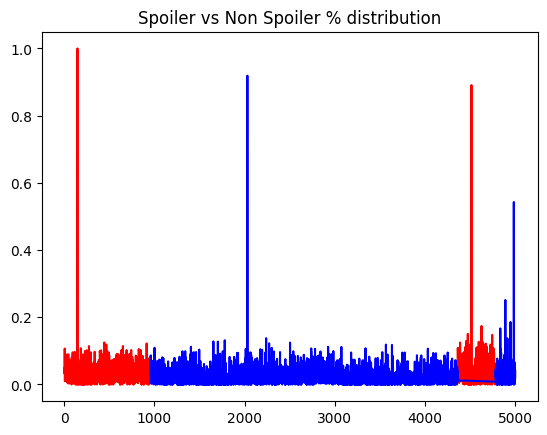

In [ ]:
fig,ax = plt.subplots()
ax.plot(cosine_similarities_df[cosine_similarities_df['is_spoiler']==True].index,cosine_similarities_df[cosine_similarities_df['is_spoiler']==True]['similarity'],ls='solid',color='red',label='is_spoiler=False')
ax.plot(cosine_similarities_df[cosine_similarities_df['is_spoiler']==False].index,cosine_similarities_df[cosine_similarities_df['is_spoiler']==False]['similarity'],ls='solid',color='blue',label='is_spoiler=True')
plt.title('Spoiler vs Non Spoiler % distribution')
plt.show()

In [ ]:
## Function to calculate similarity  #same as cosine_similarities_df
# Your code here
num_reviews = cosine_similarities.shape[0]
# Create an array to store the similarities
similarities = []
for i in range(num_reviews):
    similarity = cosine_similarities[i,i]
    similarities.append(similarity)
similarities = np.array(similarities)

similarities_pd = pd.DataFrame(similarities,columns=['similarity'])
similarities_pd['is_spoiler'] = combined_df['is_spoiler']
similarities_pd

,similarity,is_spoiler
0,0.047813,True
1,0.033238,True
2,0.049540,True
3,0.044000,True
4,0.051075,True
...,...,...
4995,0.019941,False
4996,0.004808,False
4997,0.022659,False
4998,0.043391,False


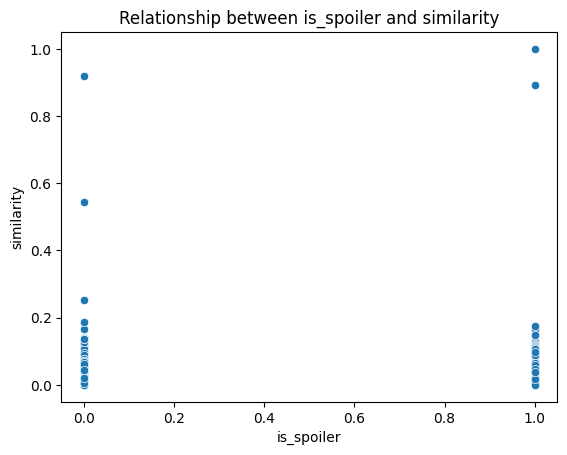

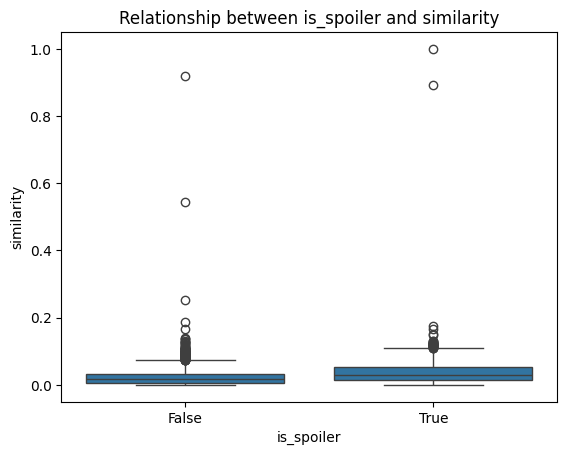

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.scatterplot(x='is_spoiler',y='similarity',data=similarities_pd)
plt.title('Relationship between is_spoiler and similarity')
plt.xlabel('is_spoiler')
plt.ylabel('similarity')
plt.show()

sns.boxplot(x='is_spoiler',y='similarity',data=similarities_pd)
plt.title('Relationship between is_spoiler and similarity')
plt.xlabel('is_spoiler')
plt.ylabel('similarity')
plt.show()

### This completes the EDA part. We would highly encourage you to add more subsections to EDA & explore the data in more depth, if you have more time. Let's get down to Text preprocessing & then the modeling part!!

## Text Preprocessing

Steps-
1. Analyze & observe the patterns in text, because data cleaning depends a lot on your use case.
2. Remove special characters, any hyperlinks etc. Pls note that sometimes special characters like ! etc. can also add to the context, so remove the special characters accordingly.
3. Remove stopwords, again depending on your text corpus.


In [ ]:
# Your code here
combined_df['review_text_after_stop_words'].loc[0]

"oscar year , shawshank redemption ( written directed frank darabont , novella rita hayworth shawshank redemption , stephen king ) nominated seven academy awards , walked away zero . best picture went forrest gump , shawshank pulp fiction `` happy nominated . '' course hindsight 20/20 , history looks back gump good film , pulp redemption remembered all-time best . pulp , however , success word `` go , '' making huge splash cannes making writer-director american master two films . andy dufresne co. , success n't come easy . fortunately , failure n't life sentence.after opening 33 screens take $ 727,327 , $ 25m film fell fast theatres finished mere $ 28.3m . reasons failure many . firstly , title clunker . iconic fans today , 1994 , people knew cared 'shawshank ' . dvd , tim robbins laughs recounting fans congratulating `` 'rickshaw ' movie . '' marketing-wise , film 's nightmare , 'prison drama ' tough sell women , story love two best friends n't spell winner men . worst , movie slow mo

### **Model Training - Tips and Tricks**
- Since the dataset is huge, you can train the model on a **smaller subset of data**. This will reduce both the training time & the compute required. Just observe the class distribution to decide how do you want to take a subset- if the dataset is highly imbalanced, we would suggest you to do a majority undersampling to reduce the size of data, otherwise do a stratified sampling to ensure the same event rate as that of population.
- We encourage you to try out several model architectures and algorithms such as simple feed forward neural networks, Neural Networks based embeddings followed by classical models such as Logistic regression, RNNs/LSTMs and Transformer based models such as BERT.
- If you wish to train large models such as BERT, you will require access to GPUs. Colab provides access to GPUs, but it requires you to interactively work on the notebook.
Therefore, it is strongly recommended that you utilize Kaggle wherever possible. Kaggle offers you 35 hours of High Performance Multi-GPU compute per week.
- It is often assumed that Kaggle is just a notebook based environment, and you need to actively interact with the notebook to keep it running. The same isn’t true. You can easily run your notebooks as asynchronous jobs on Kaggle, save your models/datasets as outputs, and load those outputs (models/datasets) for further analysis.
- This guide, although a bit old explains how to commit and run your Kaggle notebooks and use their outputs later: https://towardsdatascience.com/saving-and-loading-pytorch-models-in-kaggle-3dadc0af1bd9

## Modeling

### Train, Validation and Test Split

In [ ]:
from sklearn.model_selection import train_test_split

## create 3 subsets of data- train, validation & test with 70,15 & 15 percent respectively!

X = combined_df['review_text_after_stop_words']
y = combined_df['is_spoiler']

# First split: 85% for training (temporary) + validation, 15% for testing
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.15, random_state=42)

# Second split: From the 85%, approximately 70% for training, 15% for validation
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.15, random_state=42)

In [ ]:
X_train

,review_text_after_stop_words
3507,movie plot wazoo ! acting superb . robbins fre...
4793,"part reason godfather popular , first viewing ..."
2699,shawshenk redenption best movie ever seen cate...
2270,"great actors , great direction fascinating sto..."
1948,shawshank redemption without doubt one brillia...
...,...
2898,great movie received 7 academy award nominatio...
1253,"new commenting movies , maybe n't started tryi..."
609,"movie really great , enjoyed every minute . wa..."
2938,film would touch heart would inspire lead visi...


### BERT Model finetuning using HuggingFace Transformers & Pytorch
Again, similar to previous parts, this one can also be done in multiple ways like using a HuggingFace trainer class which kind of abstracts the Pytorch training loops, we encourage you to explore that approach as well! But since one of the objectives of the project is also to get more hands-on on Pytorch framework, its Dataloader classes etc, we expect you to attempt this using Pytorch!

### Required Imports

In [ ]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 14.1 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
import torch.nn as nn  # Import PyTorch's neural network module
from transformers import AutoTokenizer, AutoModelForSequenceClassification  # Import specific modules from the Hugging Face Transformers library
from datasets import load_dataset  # Import a function to load datasets
from torch.utils.data import DataLoader, TensorDataset  # Import PyTorch data loading utilities
from tqdm import tqdm  # Import tqdm for progress tracking
import os  # Import the os module for operating system-related functions
from sklearn.metrics import classification_report, accuracy_score

### Model Training Steps

In [ ]:
# Step-1

## Set the device to GPU if available, otherwise use CPU
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [ ]:
# Step-2

## Define args dictionary
# Your code here
args = {
    'batch_size': 4,#16
    'learning_rate': 2e-5,
    'epochs': 3,
    'max_length': 512
}

In [ ]:
# Step-3

# Set hyperparameters and other configurations
batch_size = args['batch_size']  # Get the batch size from the arguments
learning_rate = args['learning_rate']  # Get the learning rate from the arguments
epochs = args['epochs']  # Get the number of training epochs from the arguments
max_length = args['max_length']  # Get the maximum sequence length from the arguments

In [ ]:
# Step-4

## Assign the model name to a variable
model_name = "google-bert/bert-base-uncased"

In [ ]:
# Step-5

## Initialize Bert Tokenizer using Autotokenizer class
# Your code here
tokenizer = AutoTokenizer.from_pretrained(model_name,truncation=True,padding='max_length',max_length=51)
# Load the BERT model for sequence classification using AutoModelForSequenceClassification class
# Move the model to the specified device (GPU or CPU)
model = AutoModelForSequenceClassification.from_pretrained(model_name).to(device)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at google-bert/bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# Step-6

## Separate out the text & labels from train, val & test dataframes
# Your code here
# Training data
train_text = X_train  # Already contains 'review_text_after_stop_words'
train_labels = y_train # Already contains 'is_spoiler'

# Validation data
val_text = X_val     # Already contains 'review_text_after_stop_words'
val_labels = y_val    # Already contains 'is_spoiler'

# Testing data
test_text = X_test    # Already contains 'review_text_after_stop_words'
test_labels = y_test   # Already contains 'is_spoiler'

In [ ]:
val_text

,review_text_after_stop_words
1474,"reason movie citizen kane , godfather 2 , etc ..."
2545,film gripping holds straight start . never wan...
1814,"film , ability impress viewers different taste..."
3325,"'m fan king 's work . confess , first saw rita..."
3149,frank darabont genius . one critically acclaim...
...,...
3781,thought movie amazing movie 've ever seen next...
767,inflicted shawshank redemption school trip coa...
156,really amazing movie ever seen lifetime . cast...
3844,shawshank redemption absolutely terrific movie...


In [ ]:
# Step-7

## Tokenize & encode each subset of data
# train_encodings= [tokenizer(text) for text in train_text]
# val_encodings= [tokenizer(text) for text in val_text]
# test_encodings= [tokenizer(text) for text in test_text]
train_encodings = tokenizer(list(train_text), truncation=True, padding=True)
val_encodings = tokenizer(list(val_text), truncation=True, padding=True)
test_encodings = tokenizer(list(test_text), truncation=True, padding=True)

In [ ]:
{k: [dic[k] for dic in train_encodings] for k in train_encodings[1]}  #TBD

TypeError: 'tokenizers.Encoding' object is not iterable

In [ ]:
train_encodings

{'input_ids': [[101, 3185, 5436, 11333, 23221, 999, 3772, 21688, 1012, 18091, 11462, 3284, 3185, 1012, 2116, 6699, 3909, 2172, 2529, 2568, 1012, 2681, 15180, 1012, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
# import torch
# from torch.utils.data import Dataset
# from datasets import Dataset

# class TextDataset(Dataset):
#     def __init__(self, encodings, labels):
#         self.encodings = encodings
#         self.labels = labels

#     # def __getitem__(self, idx):
#     #     item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
#     #     item['labels'] = torch.tensor(self.labels[idx])
#     #     return item

#     def __getitem__(self, idx):
#         # Get the data for a single item or a batch
#         if isinstance(idx, list):
#             # For batches, pad sequences to the same length
#             max_length = max(len(self.encodings['input_ids'][i]) for i in idx)

#             # Pad 'input_ids' and 'attention_mask'
#             padded_input_ids = [self.encodings['input_ids'][i] + [0] * (max_length - len(self.encodings['input_ids'][i])) for i in idx]
#             padded_attention_mask = [self.encodings['attention_mask'][i] + [0] * (max_length - len(self.encodings['attention_mask'][i])) for i in idx]

#             item = {
#                 'input_ids': torch.tensor(padded_input_ids),
#                 'attention_mask': torch.tensor(padded_attention_mask)
#             }
#             item['labels'] = torch.tensor([self.labels[i] for i in idx])
#         else:
#             # For single items, no need to pad
#             item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
#             item['labels'] = torch.tensor(self.labels[idx])

#         return item

#     def __len__(self):
#         return len(self.labels)

In [ ]:
import torch
from torch.utils.data import Dataset

class TextDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        # Ensure labels are accessed correctly, handling both single indices and lists
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

In [ ]:
# train_encodings_dict = {k: [dic[k] for dic in train_encodings] for k in train_encodings[0]}
# val_encodings_dict = {k: [dic[k] for dic in val_encodings] for k in val_encodings[0]}
# test_encodings_dict = {k: [dic[k] for dic in test_encodings] for k in test_encodings[0]}

# Access the values of 'input_ids', 'attention_mask', etc. directly using keys
train_encodings_dict = {k: train_encodings[k] for k in train_encodings.keys()}
val_encodings_dict = {k: val_encodings[k] for k in val_encodings.keys()}
test_encodings_dict = {k: test_encodings[k] for k in test_encodings.keys()}

# Convert to PyTorch tensors
for k in train_encodings_dict:
    train_encodings_dict[k] = torch.tensor(train_encodings_dict[k])
for k in val_encodings_dict:
    val_encodings_dict[k] = torch.tensor(val_encodings_dict[k])
for k in test_encodings_dict:
    test_encodings_dict[k] = torch.tensor(test_encodings_dict[k])

# Assuming you want to use your custom TextDataset
# Create Datasets using your custom TextDataset (make sure it's defined)
train_dataset = TextDataset(train_encodings_dict, train_labels)  # Assuming you have train_labels
val_dataset = TextDataset(val_encodings_dict, val_labels)      # Assuming you have val_labels
test_dataset = TextDataset(test_encodings_dict, test_labels)    # Assuming you have test_labels

In [ ]:
train_dataset[0]

<ipython-input-58-c2ad2ea17f81>:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
<ipython-input-58-c2ad2ea17f81>:12: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  item['labels'] = torch.tensor(self.labels[idx])


{'input_ids': tensor([  101,  2228,  2143,  2673,  6472,  3284,  3014, 11067,  1012,  2296,
          4853,  2143,  1010, 17743,  1012,  2052,  4495,  2404,  2143,  2322,
          7395,  1012,  2052,  2245,  5128,  1012,  5889,  2377,  8235,  1012,
          2673,  6669,  3376,  1012,  8639,  2015,  3827,  2166, 21527,  4857,
          2135,  2825,  1012,   102,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,   

In [ ]:
# # Step-8

# ## Create PyTorch datasets using train_encodings, val_encodings & test_encodings
# # Your code here
# train_encodings_dict = {k: [dic[k] for dic in train_encodings] for k in train_encodings[0]}
# val_encodings_dict = {k: [dic[k] for dic in val_encodings] for k in val_encodings[0]}
# test_encodings_dict = {k: [dic[k] for dic in test_encodings] for k in test_encodings[0]}
# train_dataset =
# val_dataset = # Your code here
# test_dataset = # Your code here

In [ ]:
# Step-9

## Create data loaders
from torch.utils.data import DataLoader
train_loader= DataLoader(train_dataset,shuffle=True,batch_size=batch_size)
val_loader= DataLoader(val_dataset,shuffle=True,batch_size=batch_size)
test_loader= DataLoader(test_dataset,shuffle=True,batch_size=batch_size)

In [ ]:
# Step-10

## Define the BERT-based text classifier model using AutoModelForSequenceClassification class
# Your code here
from transformers import AutoModelForSequenceClassification
model = AutoModelForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=2).to(device)

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
train_loader

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader

class TextDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __len__(self):
        return len(self.labels)  # Length should be based on labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        # Ensure labels are accessed correctly, handling both single indices and lists
        item['labels'] = torch.tensor(self.labels[idx])
        return item

# Assuming you have train_encodings_dict, val_encodings_dict, test_encodings_dict
# and y_train, y_val, y_test (labels) from previous steps

# Convert labels to lists if they are not already
y_train = y_train.tolist() if isinstance(y_train, (torch.Tensor, list)) else y_train.to_list()
y_val = y_val.tolist() if isinstance(y_val, (torch.Tensor, list)) else y_val.to_list()
y_test = y_test.tolist() if isinstance(y_test, (torch.Tensor, list)) else y_test.to_list()

train_dataset = TextDataset(train_encodings_dict, y_train)
val_dataset = TextDataset(val_encodings_dict, y_val)
test_dataset = TextDataset(test_encodings_dict, y_test)

# Now create your data loaders using these datasets
from torch.utils.data import DataLoader
batch_size = 16 # Or your desired batch size
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=batch_size)
val_loader = DataLoader(val_dataset, shuffle=True, batch_size=batch_size)
test_loader = DataLoader(test_dataset, shuffle=True, batch_size=batch_size)

AttributeError: 'list' object has no attribute 'tolist'

In [ ]:
# Step-11

## Training and validation loop
## Training and validation loop
from tqdm import tqdm
import torch
import torch.nn.functional as F

# Assuming you have defined optimizer and scheduler before this loop

optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)  # Example optimizer
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.9) # Example scheduler

for epoch in tqdm(range(epochs)):
    model.train()  # Set the model in training mode
    total_loss = 0.0  # Initialize a variable to store the total loss

    for batch in tqdm(train_loader, leave=False):  # Iterate over training data batches
        # Get the inputs and labels from the batch
        input_ids = batch['input_ids'].to(device)  # Move to device
        attention_mask = batch['attention_mask'].to(device)  # Move to device
        labels = batch['labels'].to(device)  # Move to device

        # Create input dictionary for the model
        input = {
            'input_ids': input_ids,
            'attention_mask': attention_mask
        }

        # Convert labels to LongTensor before one-hot encoding
        labels = labels.type(torch.LongTensor).to(device) # Move to device before one-hot encoding

        # Convert labels to one-hot encoding
        labels = F.one_hot(labels, num_classes=2).float()

        # Zero the gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(**input, labels=labels)

        # Get the loss
        loss = outputs.loss

        # Backward pass
        loss.backward()

        # Update the parameters
        optimizer.step()

        # Update the learning rate scheduler
        scheduler.step()

        # Accumulate the total loss
        total_loss += loss.item()

    # Calculate and print the average training loss for the epoch
    avg_train_loss = total_loss / len(train_loader)
    print(f"Epoch {epoch + 1}, Training Loss: {avg_train_loss:.4f}")

    # Validation loop (add similar logic for validation)

In [ ]:
# Step-11

## Training and validation loop
for epoch in tqdm(range(epochs)):
    model.train()  # Set the model in training mode
    total_loss = 0.0  # Initialize a variable to store the total loss

    for batch in tqdm(train_loader, leave=False):  # Iterate over training data batches
      optimizer.zero_grad()
    # Your code here
      # optimizer.zero_grad()
      # outputs = model(**input,labels = labels)
      # loss = outputs.loss
      # loss.backward()
      # optimizer.step()
      # scheduler.step()





  0%|          | 0/46 [00:00<?, ?it/s]<ipython-input-63-80a6eec0f442>:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}

                                      
100%|██████████| 3/3 [00:00<00:00, 11.02it/s]


In [ ]:
# Step-12

## Testing loop

model.eval()  # Set the model in evaluation mode
test_loss = 0
correct = 0

with torch.no_grad():  # Disable gradient computation for testing
    for batch in test_loader:  # Iterate over test data batches
        # Get the inputs and labels from the batch
        input_ids = batch['input_ids'].to(device)  # Move to device
        attention_mask = batch['attention_mask'].to(device)  # Move to device
        labels = batch['labels'].to(device)  # Move to device

        # Create input dictionary for the model
        input = {
            'input_ids': input_ids,
            'attention_mask': attention_mask
        }

        # Ensure labels are of type long
        labels = labels.long()

        # Forward pass
        outputs = model(**input, labels=labels)

        # Get the loss and predictions
        loss = outputs.loss
        logits = outputs.logits  # Get the raw model outputs

        # Accumulate the test loss
        test_loss += loss.item()

        # Get predicted labels
        _, predicted_labels = torch.max(logits, dim=1)

        # Calculate the number of correct predictions
        correct += (predicted_labels == labels).sum().item()

# Calculate the average test loss and accuracy
avg_test_loss = test_loss / len(test_loader)
accuracy = correct / len(test_loader.dataset)

# Print the results
print(f"Test Loss: {avg_test_loss:.4f}")
print(f"Accuracy: {accuracy:.4f}")

<ipython-input-63-80a6eec0f442>:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}


ValueError: Target size (torch.Size([16])) must be the same as input size (torch.Size([16, 2]))

In [ ]:
# Step-10

## Define the BERT-based text classifier model using AutoModelForSequenceClassification class
# Your code here
from transformers import AutoModelForSequenceClassification, AutoTokenizer

# Load the tokenizer with the 'bert-base-uncased' model
tokenizer = AutoTokenizer.from_pretrained('bert-base-uncased')

# Define the model
model = AutoModelForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=2).to(device)


# Step-8

## Create PyTorch datasets using train_encodings, val_encodings & test_encodings

# Assuming you have 'train_encodings', 'val_encodings', 'test_encodings' from previous steps

from torch.utils.data import Dataset, DataLoader, TensorDataset


class TextClassificationDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

# Function to convert the encodings to the desired format for the TextClassificationDataset
def format_encodings(encodings):
    formatted_encodings = {k: [dic[k] for dic in encodings] for k in encodings[0]}
    return formatted_encodings


# Format encodings for training, validation, and testing
train_encodings_formatted = format_encodings(train_encodings)
val_encodings_formatted = format_encodings(val_encodings)
test_encodings_formatted = format_encodings(test_encodings)

# Assuming you have y_train, y_val, y_test for your labels
train_dataset = TextClassificationDataset(train_encodings_formatted, y_train)
val_dataset = TextClassificationDataset(val_encodings_formatted, y_val)
test_dataset = TextClassificationDataset(test_encodings_formatted, y_test)



# Step-11

## Training and validation loop
from tqdm import tqdm
import torch

# Assuming you have defined optimizer and scheduler before this loop
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)  # Example optimizer
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.9) # Example scheduler

for epoch in tqdm(range(epochs)):
    model.train()  # Set the model in training mode
    total_loss = 0.0  # Initialize a variable to store the total loss

    for batch in tqdm(train_loader, leave=False):  # Iterate over training data batches
        # Get the inputs and labels from the batch
        input_ids = batch['input_ids'].to(device)  # Move to device
        attention_mask = batch['attention_mask'].to(device)  # Move to device
        labels = batch['labels'].to(device)  # Move to device

        # Truncate sequences to the maximum length the model can handle
        input_ids = input_ids[:, :tokenizer.model_max_length]
        attention_mask = attention_mask[:, :tokenizer.model_max_length]

        # Create input dictionary for the model
        input = {
            'input_ids': input_ids,
            'attention_mask': attention_mask
        }

        # Zero the gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(**input, labels=labels)

        # Get the loss
        loss = outputs.loss

        # Backward pass
        loss.backward()



tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


TypeError: 'tokenizers.Encoding' object is not iterable

## Model Evaluation

Evaluate the above models based on the various evaluation metrics like accuracy, precision, recall, F1-score, etc.

In [ ]:
# Step-1

## Build confusion matrix
# Your code here

In [ ]:
# Step-2

## Print the classification report

# Your code here

In [ ]:
# Step-3

## Plot the training & validation loss
# Your code here.

**Observations**

*Document your observations regarding the different models that you have built, and their evaluation metrics*

-
-
-

***Checklist***

Ensure that the following is done:

- The accuracy/precision/recall of the best model is at least between 60-70%
- Observe the context window for the model you pick because that will truncate the text input length & hence the context that the model will have. This ofcourse impacts the model performance. So you can look for larger BERT models from HuggingFace repo to increase the context length but the trade-off is more compute time & resources!

## Summary

Good work completing all the steps till now!

Now, go ahead and summarize your entire work and findings below:

-
-
-

### **Future Improvements(Optional)**
- **Approach-2 for Model Training**

Feel free to refer the below article to understand another approach for Bert finetuning which is using the trainer class from HuggingFace transformers. It abstracts the Pytorch loops & is more convenient but Pytorch loops provide more flexibility- https://github.com/philschmid/deep-learning-pytorch-huggingface/blob/main/training/pytorch-2-0-bert-text-classification.ipynb




---



---
- **Improving the Model Performance**:

  In the previous model training exercise, you had taken the entire dataset and randomly curated 25000 reviews. Now, randomly selecting reviews may not provide enough clear examples of spoilers, as most reviews, even of popular movies, might not include explicit spoilers. Selectively curating your dataset could significantly improve the model's performance. Here are some suggestions to improve the dataset for better spoiler detection:

  **Identify Top Movies**: Focus on movies with the most reviews, such as The Dark Knight, Shawshank Redemption, and The Godfather.

  **Class Distribution**: Check how many reviews fall under the Spoiler vs. Non-Spoiler classes.

  **Filter Reviews**: Only keep reviews within ~200-350 words. This ensures that longer reviews are used for better training but they’re not too long (to fit BERT's 512-token limit).

  **Target 10K Spoiler Reviews**: Select the top k movies whose Spoiler reviews add up to around 10,000.

  **Balanced Dataset**: After filtering, aim for a dataset where every Spoiler review has a matching Non-Spoiler review, resulting in 20,000 balanced data points.

  **Initial Model Inference**: Use these selected movies for initial model building. Adjust the business problem if needed.

  You can also build similar models by curating specific datasets to improve data quality. Accordingly you can see if the model performance is increasing or decreasing. However a warning: This may lead to your colab compute reducing drastically, hence build the models wisely.